# **Bin2cell proof of principle**

#### **Comparison of cell type annotation based on Bin2cell cells vs. cell type annotation based on 8 um binning**

In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os
import bin2cell as b2c
import celltypist
from celltypist import models
from sklearn.metrics import homogeneity_score
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.set_loglevel('WARNING')


### Choose the celltypes models

In [2]:
# Download latest celltypist models
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /pasteur/appa/homes/npont/.celltypist/data/models
💾 Downloading model [1/54]: Immune_All_Low.pkl
💾 Downloading model [2/54]: Immune_All_High.pkl
💾 Downloading model [3/54]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/54]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/54]: Adult_Human_MTG.pkl
💾 Downloading model [6/54]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/54]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/54]: Adult_Human_Skin.pkl
💾 Downloading model [9/54]: Adult_Human_Vascular.pkl
💾 Downloading model [10/54]: Adult_Mouse_Gut.pkl
💾 Downloading model [11/54]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [12/54]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [13/54]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [14/54]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [15/54]: COVID19_HumanCha

In [3]:
# Let's see which model we can use for the cell type annotation of our EOM visium HD slide

models.models_path
description = models.models_description()
subset = description[description['model'].str.contains('Human')]

for model, desc in zip(subset['model'], subset['description']):
    print(f"Model: {model}\nDescription: {desc}\n{'-'*50}")

👉 Detailed model information can be found at `https://www.celltypist.org/models`


Model: Adult_Human_MTG.pkl
Description: cell types and subtypes (10x-based) from the adult human middle temporal gyrus
--------------------------------------------------
Model: Adult_Human_PancreaticIslet.pkl
Description: cell types from pancreatic islets of healthy adult humans
--------------------------------------------------
Model: Adult_Human_PrefrontalCortex.pkl
Description: cell types and subtypes from the adult human dorsolateral prefrontal cortex
--------------------------------------------------
Model: Adult_Human_Skin.pkl
Description: cell types from human healthy adult skin
--------------------------------------------------
Model: Adult_Human_Vascular.pkl
Description: vascular populations combined from multiple adult human organs
--------------------------------------------------
Model: COVID19_HumanChallenge_Blood.pkl
Description: detailed blood cell states from 16 individuals after being challenged with SARS-CoV-2
--------------------------------------------------
Model: 

We pick the model 'stromal and immune populations from the human fetus'. It is not directly linked to extraocular muscle but it contains fetus data which can be considered as starting from 9 wpc and we actually have a 10 wpc EOM. 

Additionnally, I guess immune cells can be found a bit everywhere so it's not a total non-sense to study them in our EOM slides.

### Load, filter, annotate and embed bin2cell data

In [4]:
# Load AnnData object created with Bin2cell 
cdata = sc.read_h5ad('./cdata_EOM.h5ad')

In [5]:
cdata.var_names_make_unique()

# Keep only cells corresponding to a grouping of minimum 6 bins
cdata = cdata[cdata.obs['bin_count']>5] 

# Need integers for seuratv3 hvgs
cdata.X.data = np.round(cdata.X.data)

# Back up version
cdata.raw = cdata.copy()

sc.pp.filter_genes(cdata, min_cells=3)
sc.pp.filter_cells(cdata,min_genes=100)
sc.pp.calculate_qc_metrics(cdata,inplace=True)

# Get the 5000 most variable genes 
sc.pp.highly_variable_genes(cdata,n_top_genes=5000,flavor="seurat_v3")
# Normalize such that each cell sum of genes expression equals 10'000 
sc.pp.normalize_total(cdata,target_sum=1e4)
sc.pp.log1p(cdata)

In [6]:
# Cell type annotation
predictions_b2c = celltypist.annotate(cdata, model = 'Pan_Fetal_Human.pkl', majority_voting = False)
cdata = predictions_b2c.to_adata()

🔬 Input data has 75566 cells and 17944 genes
🔗 Matching reference genes in the model
🧬 6338 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [7]:
# Keep only the variable genes for the PCA
cdata = cdata[:, cdata.var["highly_variable"]]
sc.pp.scale(cdata, max_value=10)
sc.pp.pca(cdata, use_highly_variable=True)
sc.pp.neighbors(cdata)
sc.tl.umap(cdata)

2025-03-10 10:27:25.846258: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


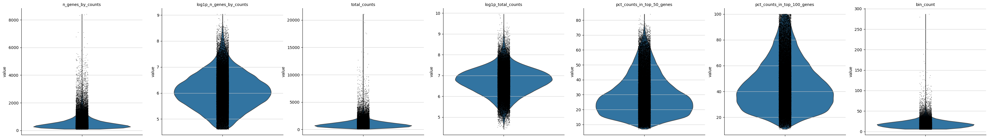

In [8]:
sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(cdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes','bin_count'],
             jitter=0.05, multi_panel=True)

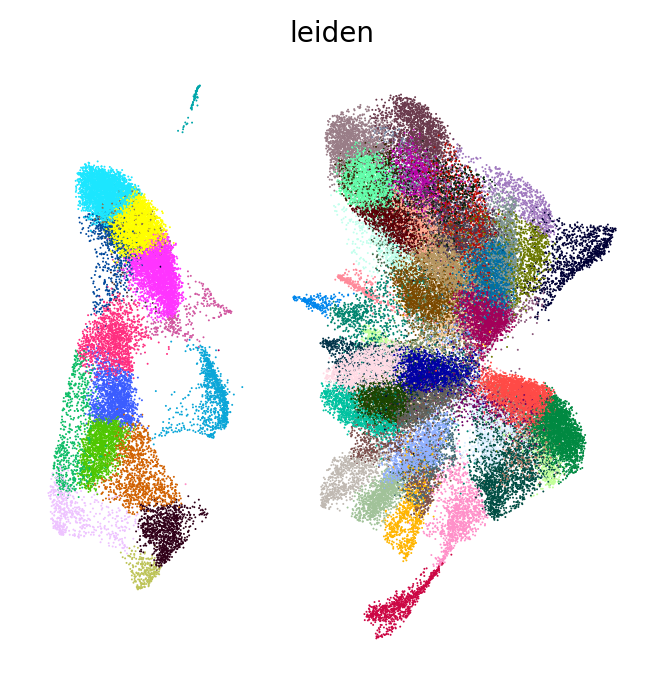

In [9]:
# CLustering 
sc.set_figure_params(dpi=100,fontsize=10,)
os.chdir('./')
sc.tl.leiden(cdata,resolution=6,key_added='leiden')
sc.pl.umap(cdata,color=['leiden'],size=2,wspace=0.25,frameon=False,legend_loc=None)

In [10]:
# Recover raw reads and save
cdata.raw.to_adata().write('./b2c_raw.h5ad')

### Load, filter, annotate and embed 8 um data

In [11]:
dir_base = '/pasteur/zeus/projets/p02/Fast_npz/Naomie/visium_HD/visiumHD_outputs/EOM/'
dir_base_2 = "counts/Sample_A1/outs/"
path_008 = dir_base + dir_base_2 + "binned_outputs/square_008um/"

dir_base_raw = '/pasteur/zeus/projets/p02/CSD_hpc/data/lab/spatial/EOM_VisiumHD/'

source_image_path = dir_base_raw + "scan_he/tiff_converted/sample_A1_highres_rgb.tif"
spaceranger_image_path = dir_base + dir_base_2 + "spatial"

In [12]:
bdata = b2c.read_visium(path_008, source_image_path = source_image_path, 
                        spaceranger_image_path = spaceranger_image_path)

bdata.var_names_make_unique()

# Back up version
bdata.raw = bdata.copy()

In [13]:
## Filtering ##

# Require genes to show up in min 3 spots
sc.pp.filter_genes(bdata, min_cells=3)

# Remove all 8 um binnings having less than 100 genes
sc.pp.filter_cells(bdata, min_genes=100)

sc.pp.calculate_qc_metrics(bdata,inplace=True)

In [14]:
# Get most variable genes for the PCA + Normalize

sc.pp.highly_variable_genes(bdata,n_top_genes=5000,flavor="seurat_v3")
sc.pp.normalize_total(bdata,target_sum=1e4)
sc.pp.log1p(bdata)

In [15]:
# Predict cell types (related to stromal and immune populations from the human fetus) using CellTypist
predictions_8bin = celltypist.annotate(bdata, model = 'Pan_Fetal_Human.pkl', majority_voting = False)

🔬 Input data has 125170 cells and 17958 genes
🔗 Matching reference genes in the model
🧬 6341 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [16]:
# Add celltype predictions to the AnnData
bdata = predictions_8bin.to_adata()

In [17]:
bdata = bdata[:, bdata.var["highly_variable"]] # Added by Naomie to do the same for bdata than for cdata because they only filter variable genes for cdata

sc.pp.scale(bdata, max_value=10)
sc.pp.pca(bdata, use_highly_variable=True)
sc.pp.neighbors(bdata)
sc.tl.umap(bdata)

... storing 'feature_types' as categorical
... storing 'genome' as categorical


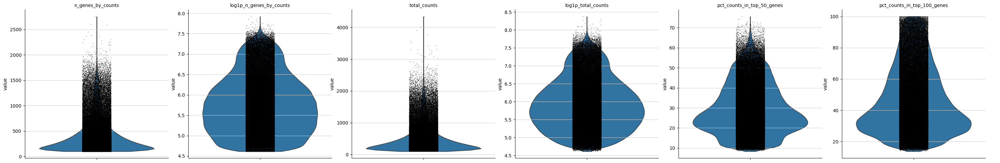

In [18]:
# QC metrics visualizations

sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(bdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes'],
             jitter=0.1, multi_panel=True)

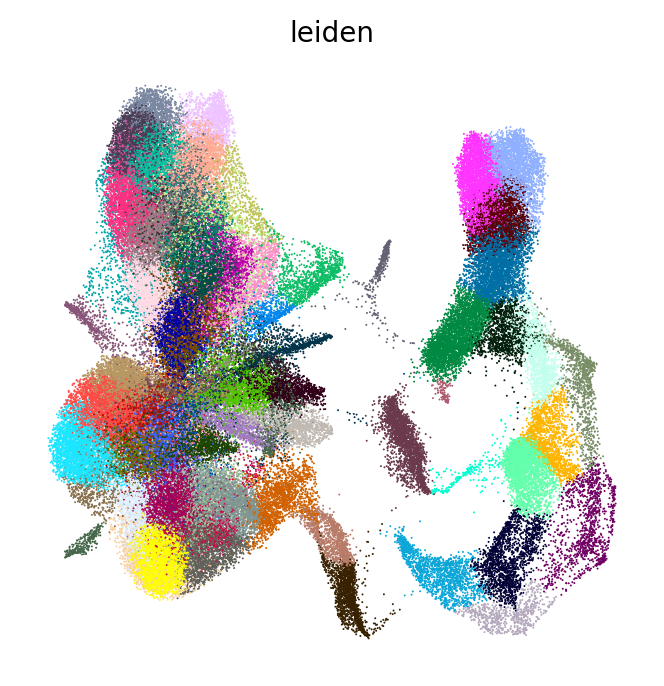

In [19]:
# Visualization of clustering

sc.set_figure_params(dpi=100,fontsize=10,)
os.chdir('./')
sc.tl.leiden(bdata,resolution=6,key_added='leiden')
sc.pl.umap(bdata,color=['leiden'],size=2,wspace=0.25,frameon=False, legend_loc=None)

In [20]:
# Recover raw reads and save
bdata.raw.to_adata().write('./8bins_raw.h5ad')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


## **Load the raw data again**

In [21]:
bdata = sc.read_h5ad('./8bins_raw.h5ad')
cdata = sc.read_h5ad('./b2c_raw.h5ad')

In [22]:
# bin2cell data
cdata

AnnData object with n_obs × n_vars = 75566 × 17957
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_cropped_150_buffer'
    obsp: 'connectivities', 'distances'

In [23]:
# 8um bins
bdata

AnnData object with n_obs × n_vars = 125170 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [24]:
## Assess correspondance between leiden clusters to cell types

# It considers that the Leiden clustering labels are the true labels and CellTypist labels are the predicted ones
# homogeneity_score(true_labels,predicted_labels)
# It portrays the closeness of the Leiden clustering with CellTypist annotation
print('8um homogeneity score - '+str(homogeneity_score(bdata.obs['leiden'],bdata.obs['predicted_labels'])))
print('b2c homogeneity score - '+str(homogeneity_score(cdata.obs['leiden'],cdata.obs['predicted_labels'])))

8um homogeneity score - 0.18286606382798395
b2c homogeneity score - 0.21181976673697175


**-> b2c annotation/labelling is better than the 8um one. But still they are quite far from the leiden clustering. But I think it is because we use a special type of cell types (stromal fetus)**

### **Plotting**

In [25]:
# Make sure we're in current directory
os.chdir('./')

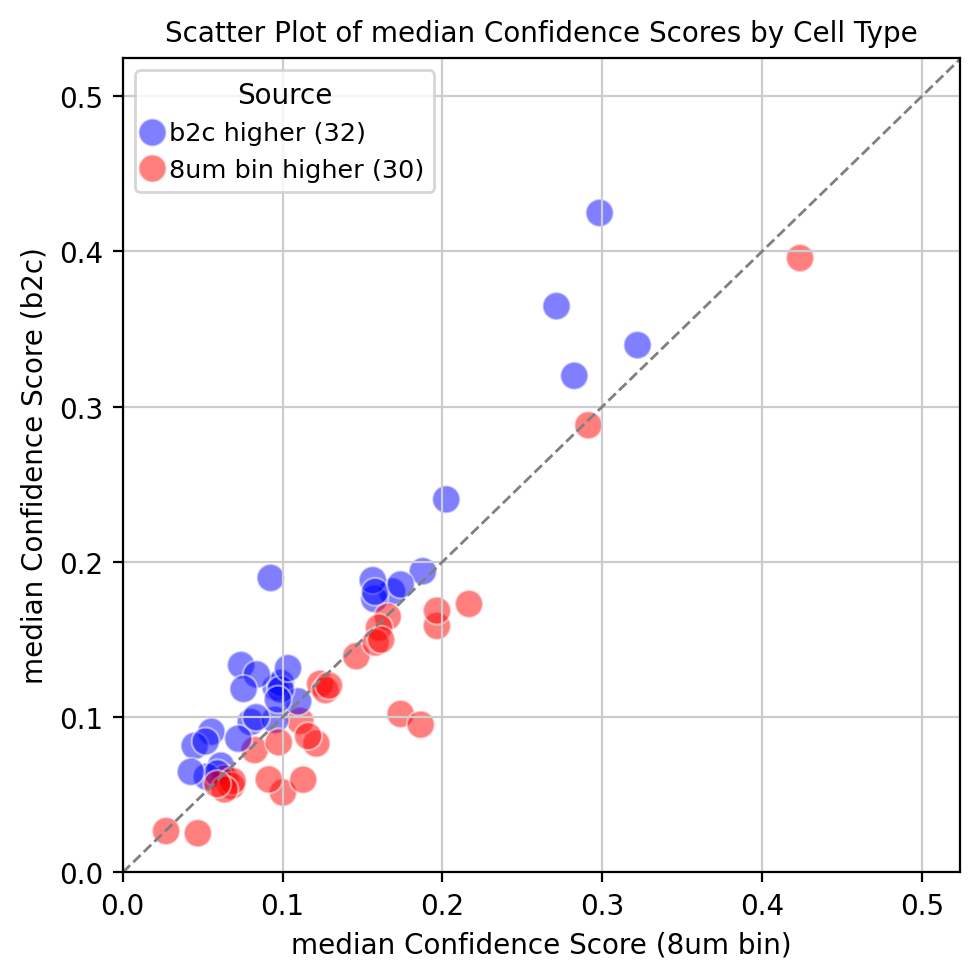

In [26]:
# Calculate the median confidence score for each cell type in bdata
bdata_medians = bdata.obs.groupby('predicted_labels')['conf_score'].median().reset_index(name='median_conf_score')
bdata_medians.set_index('predicted_labels', inplace=True)
bdata_medians['Source'] = '8um bin'
bdata_medians['counts'] = bdata.obs.groupby('predicted_labels')['conf_score'].count()

# Calculate the median confidence score for each cell type in cdata
cdata_medians = cdata.obs.groupby('predicted_labels')['conf_score'].median().reset_index(name='median_conf_score')
cdata_medians.set_index('predicted_labels', inplace=True)
cdata_medians['Source'] = 'b2c'
cdata_medians['counts'] = cdata.obs.groupby('predicted_labels')['conf_score'].count()

# Combine the results from all datasets
combined_medians = pd.concat([cdata_medians, bdata_medians], axis=1, keys=['b2c', '8um bin'])
combined_medians.columns = ['_'.join(col).strip() for col in combined_medians.columns.values]

# Calculate the maximum confidence score for each cell type across conditions
max_conf_scores = combined_medians[['b2c_median_conf_score', '8um bin_median_conf_score']].max(axis=1)
max_counts = combined_medians[['b2c_counts', '8um bin_counts']].max(axis=1)

# Filter out cell types with a maximum confidence score lower than 0.01
cell_types_to_keep = max_conf_scores[max_conf_scores >= 0.01].index
cell_types_to_keep2 = max_counts[max_counts >= 50].index

combined_medians_filtered = combined_medians.loc[combined_medians.index.isin(cell_types_to_keep)]
combined_medians_filtered = combined_medians_filtered.loc[combined_medians_filtered.index.isin(cell_types_to_keep2)]

# Determine the color based on which condition has the higher median confidence score
combined_medians_filtered['color'] = combined_medians_filtered.apply(
    lambda row: 'red' if row['8um bin_median_conf_score'] > row['b2c_median_conf_score'] else 'blue', axis=1)

# Count the number of categories higher in each condition
higher_in_8um = sum(combined_medians_filtered['color'] == 'red')
higher_in_b2c = sum(combined_medians_filtered['color'] == 'blue')

# Create a scatter plot to visualize the data
plt.figure(figsize=(5, 5))  # Adjust figure size as needed
ax = sns.scatterplot(data=combined_medians_filtered, 
                     x='8um bin_median_conf_score', y='b2c_median_conf_score', 
                     s=100, hue='color', palette={'red': 'red', 'blue': 'blue'}, alpha=0.5)

# Add a diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

# Restrict x and y axes to the relevant values
plt.xlim(0, combined_medians_filtered['8um bin_median_conf_score'].max() + 0.1)
plt.ylim(0, combined_medians_filtered['b2c_median_conf_score'].max() + 0.1)

# Add custom legend
handles, labels = ax.get_legend_handles_labels()
labels = [f'b2c higher ({higher_in_b2c})',f'8um bin higher ({higher_in_8um})']
ax.legend(handles=handles, labels=labels, title='Source')

plt.title('Scatter Plot of median Confidence Scores by Cell Type')
plt.xlabel('median Confidence Score (8um bin)')
plt.ylabel('median Confidence Score (b2c)')
plt.tight_layout()
# plt.savefig('.../figures/predictions_scatter_colored.pdf')
plt.show()
# combined_medians_filtered.to_csv('.../combined_medians_filtered_conf_score.csv')

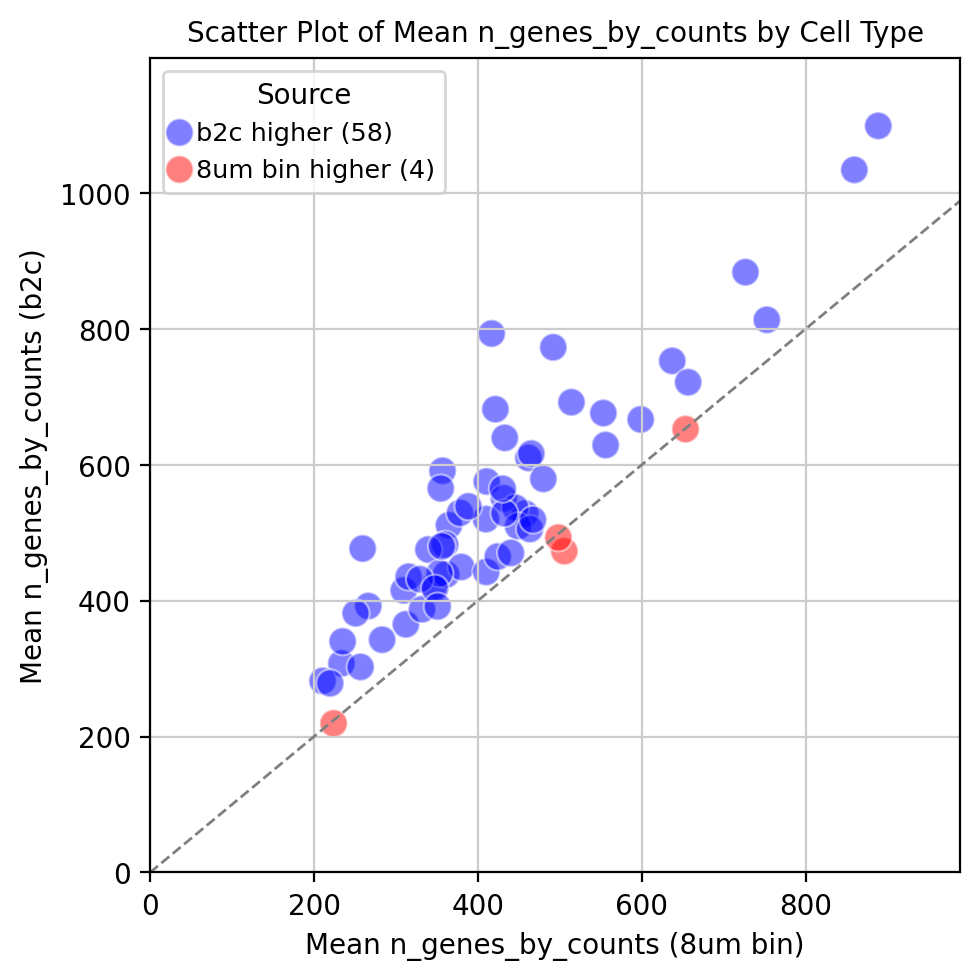

In [27]:
# Calculate the mean of n_genes_by_counts for each cell type in bdata (min number of genes with at least 1 count in a 8 um binning)
bdata_means = bdata.obs.groupby('predicted_labels')['n_genes_by_counts'].mean().reset_index(name='mean_n_genes_by_counts')
bdata_means.set_index('predicted_labels', inplace=True)
bdata_means['Source'] = '8um bin'
bdata_means['counts'] = bdata.obs.groupby('predicted_labels')['n_genes_by_counts'].count()

# Calculate the mean of n_genes_by_counts for each cell type in cdata (min number of genes with at least 1 count in a cell)
cdata_means = cdata.obs.groupby('predicted_labels')['n_genes_by_counts'].mean().reset_index(name='mean_n_genes_by_counts')
cdata_means.set_index('predicted_labels', inplace=True)
cdata_means['Source'] = 'b2c'
cdata_means['counts'] = cdata.obs.groupby('predicted_labels')['n_genes_by_counts'].count()

# Combine the results from all datasets
combined_means = pd.concat([cdata_means, bdata_means], axis=1, keys=['b2c', '8um bin'])
combined_means.columns = ['_'.join(col).strip() for col in combined_means.columns.values]

# Calculate the maximum n_genes_by_counts for each cell type across conditions
max_n_genes_by_counts = combined_means[['b2c_mean_n_genes_by_counts', '8um bin_mean_n_genes_by_counts']].max(axis=1)
max_counts = combined_means[['b2c_counts', '8um bin_counts']].max(axis=1)

# Filter out cell types with a maximum n_genes_by_counts lower than 0.1
cell_types_to_keep = max_counts[max_counts >= 50].index

combined_means_filtered = combined_means.loc[combined_means.index.isin(cell_types_to_keep)]

# Determine the color based on which condition has the higher mean n_genes_by_counts
combined_means_filtered['color'] = combined_means_filtered.apply(
    lambda row: 'red' if row['8um bin_mean_n_genes_by_counts'] > row['b2c_mean_n_genes_by_counts'] else 'blue', axis=1)

# Count the number of categories higher in each condition
higher_in_8um = sum(combined_means_filtered['color'] == 'red')
higher_in_b2c = sum(combined_means_filtered['color'] == 'blue')

# Create a scatter plot to visualize the data
plt.figure(figsize=(5, 5))  # Adjust figure size as needed
ax = sns.scatterplot(data=combined_means_filtered, 
                     x='8um bin_mean_n_genes_by_counts', y='b2c_mean_n_genes_by_counts', 
                     s=100, hue='color', palette={'red': 'red', 'blue': 'blue'}, alpha=0.5)

# Add a diagonal line for reference
max_val = max(combined_means_filtered['8um bin_mean_n_genes_by_counts'].max(), combined_means_filtered['b2c_mean_n_genes_by_counts'].max()) + 100
plt.plot([0, max_val], [0, max_val], linestyle='--', color='gray', linewidth=1)

# Restrict x and y axes to the relevant values
plt.xlim(0, combined_means_filtered['8um bin_mean_n_genes_by_counts'].max() + 100)
plt.ylim(0, combined_means_filtered['b2c_mean_n_genes_by_counts'].max() + 100)

# Add custom legend
handles, labels = ax.get_legend_handles_labels()
labels = [ f'b2c higher ({higher_in_b2c})',f'8um bin higher ({higher_in_8um})']
ax.legend(handles=handles, labels=labels, title='Source')

plt.title('Scatter Plot of Mean n_genes_by_counts by Cell Type')
plt.xlabel('Mean n_genes_by_counts (8um bin)')
plt.ylabel('Mean n_genes_by_counts (b2c)')
plt.tight_layout()
# plt.savefig('.../figures/n_genes_scatter_8um_vs_b2c.pdf')
plt.show()
# combined_means_filtered.to_csv('.../combined_means_filtered_n_genes.csv')

In [28]:
# Save again idk why

bdata.write_h5ad('./8um_anno_public.h5ad')
cdata.write_h5ad('./b2c_anno_public.h5ad')

### Visualization of Leiden clustering on the H&E

In [29]:
bdata = sc.read_h5ad('./8um_anno_public.h5ad')
cdata = sc.read_h5ad('./b2c_anno_public.h5ad')

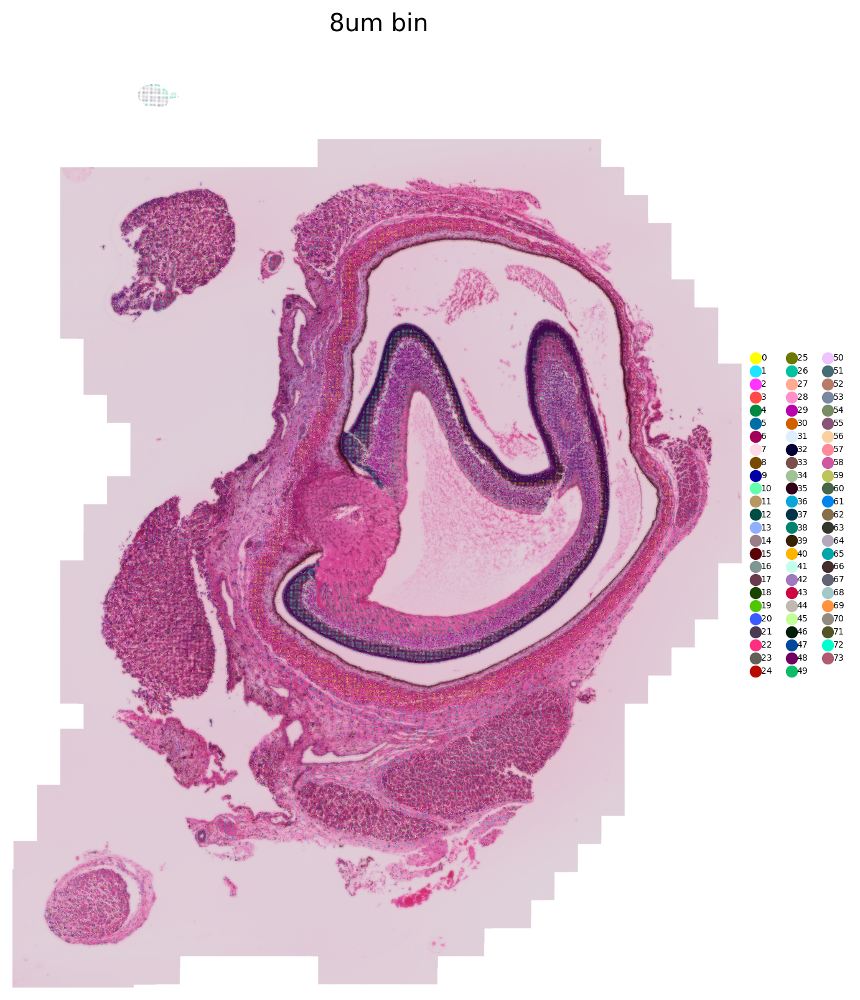

In [30]:
# Confidence threshold
conf_th = 0

# Set figure parameters
sc.set_figure_params(dpi=100, dpi_save=2000, figsize=[10, 10], format='jpg')

# Plot for 8um bin
sc.pl.spatial(bdata, color='leiden',
              title='8um bin', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, )

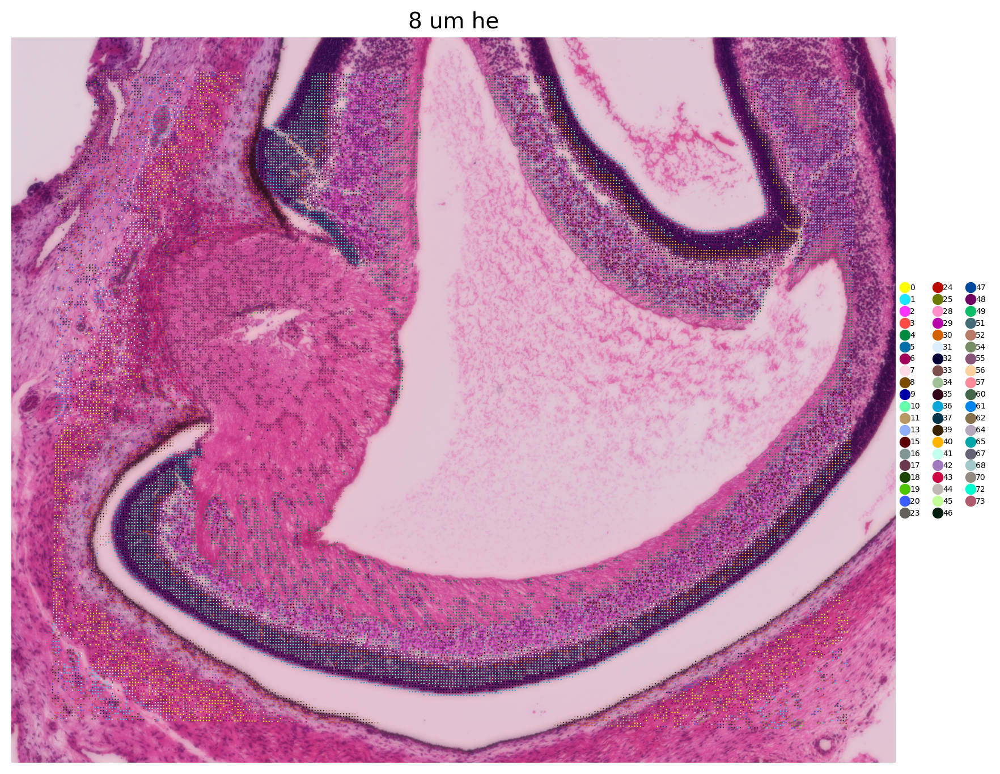

In [40]:
mask = ((bdata.obs['array_row'] >= 373) & 
        (bdata.obs['array_row'] <= 600) & 
        (bdata.obs['array_col'] >= 222) & 
        (bdata.obs['array_col'] <= 500)
       )

bdata_ROI = bdata[mask]

sc.pl.spatial(bdata_ROI, color='leiden', 
              title='8 um he', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, )

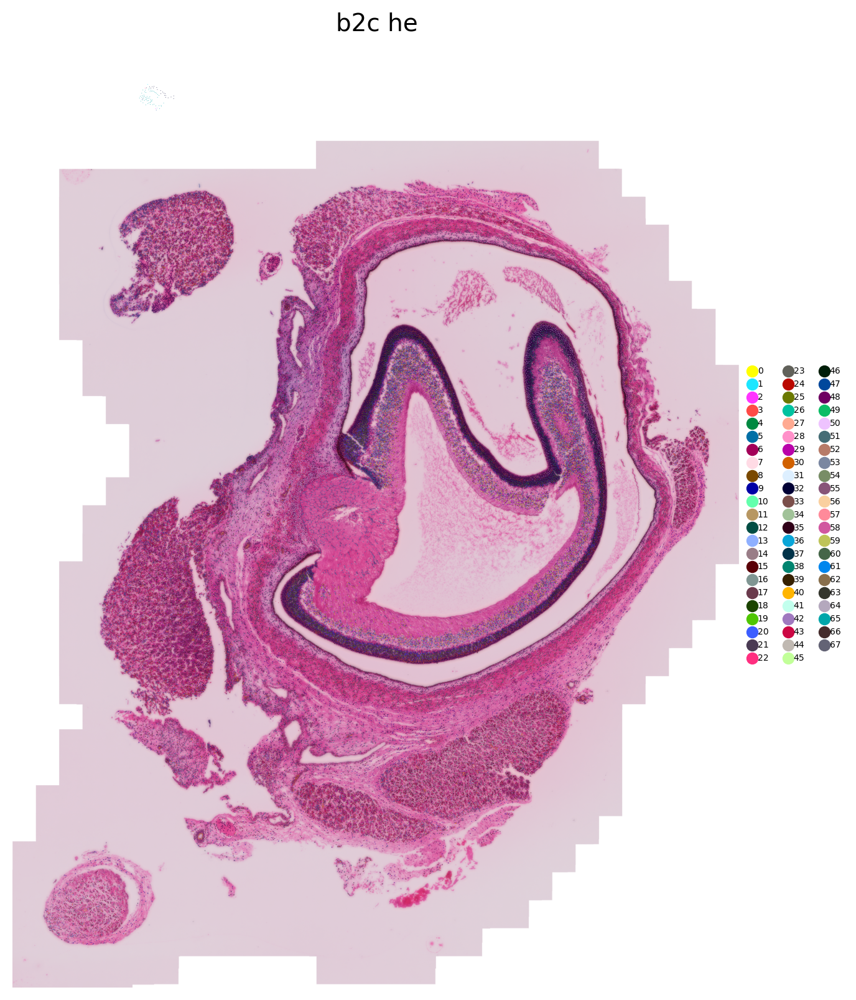

In [31]:
# Plot for b2c he
sc.pl.spatial(cdata, color='leiden', 
              title='b2c he', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, )